<a href="https://colab.research.google.com/github/gerritgr/Spatio-Temporal-Correlation/blob/main/main_Spatio_Temporal_Correlation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Get Data

In [1]:
!git clone https://github.com/gerritgr/Spatio-Temporal-Correlation
!cp -r Spatio-Temporal-Correlation/* .
!unzip NYC_vehicle_collision_2015_2016.zip
!rm -rf Spatio-Temporal-Correlation/

Cloning into 'Spatio-Temporal-Correlation'...
remote: Enumerating objects: 27, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 27 (delta 7), reused 0 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (27/27), 65.95 MiB | 11.30 MiB/s, done.
Resolving deltas: 100% (7/7), done.
Archive:  NYC_vehicle_collision_2015_2016.zip
  inflating: database.csv            


# Preprocess Data

In [2]:
import pandas as pd
from datetime import datetime
import sys, os

# Optional: Specify min and max values. Set to None to infer from data.
MIN_LAT = 40.4774
MAX_LAT = 40.9176
MIN_LONG = -74.2591
MAX_LONG = -73.7004
MIN_DATE = '01/01/2015 00:00'
MAX_DATE = '12/31/2015 00:00'  # Ensure consistent date format

# Input and output file paths
FOLDER = 'input_carcrash_vs_temperature/'
INPUT_FILE = '/content/temperature_nyc_2015_2016_data.csv'
OUTPUT_FILE = FOLDER+'measurements.csv'
os.system("mkdir "+FOLDER)

def main():
    # Read the CSV file
    try:
        df = pd.read_csv(INPUT_FILE)
    except FileNotFoundError:
        print(f"Error: The file {INPUT_FILE} does not exist.")
        sys.exit(1)
    except pd.errors.EmptyDataError:
        print(f"Error: The file {INPUT_FILE} is empty.")
        sys.exit(1)
    except pd.errors.ParserError:
        print(f"Error: The file {INPUT_FILE} is malformed.")
        sys.exit(1)

    # Ensure required columns are present
    required_columns = {'date', 'latitude', 'longitude', 'tavg'}
    if not required_columns.issubset(df.columns):
        print(f"Error: Input file must contain the following columns: {required_columns}")
        sys.exit(1)

    # Parse 'date' column to datetime without specifying format
    try:
        df['date'] = pd.to_datetime(df['date'], errors='coerce')
    except Exception as e:
        print(f"Error parsing dates: {e}")
        sys.exit(1)

    # Drop rows where date parsing failed
    initial_count = len(df)
    df = df.dropna(subset=['date'])
    dropped_count = initial_count - len(df)
    if dropped_count > 0:
        print(f"Dropped {dropped_count} rows due to unparseable dates.")

    # Infer min and max for latitude
    if MIN_LAT is None:
        min_lat = df['latitude'].min()
    else:
        min_lat = MIN_LAT

    if MAX_LAT is None:
        max_lat = df['latitude'].max()
    else:
        max_lat = MAX_LAT

    # Infer min and max for longitude
    if MIN_LONG is None:
        min_long = df['longitude'].min()
    else:
        min_long = MIN_LONG

    if MAX_LONG is None:
        max_long = df['longitude'].max()
    else:
        max_long = MAX_LONG

    # Infer min and max for dates
    if MIN_DATE is None:
        min_date = df['date'].min()
    else:
        try:
            min_date = pd.to_datetime(MIN_DATE, errors='coerce')
            if pd.isna(min_date):
                raise ValueError(f"MIN_DATE '{MIN_DATE}' could not be parsed.")
        except Exception as e:
            print(f"Error parsing MIN_DATE: {e}")
            sys.exit(1)

    if MAX_DATE is None:
        max_date = df['date'].max()
    else:
        try:
            max_date = pd.to_datetime(MAX_DATE, errors='coerce')
            if pd.isna(max_date):
                raise ValueError(f"MAX_DATE '{MAX_DATE}' could not be parsed.")
        except Exception as e:
            print(f"Error parsing MAX_DATE: {e}")
            sys.exit(1)

    # Filter the dataframe based on specified ranges
    filtered_initial_count = len(df)

    if MIN_LAT is not None:
        df = df[df['latitude'] >= min_lat]
    if MAX_LAT is not None:
        df = df[df['latitude'] <= max_lat]
    if MIN_LONG is not None:
        df = df[df['longitude'] >= min_long]
    if MAX_LONG is not None:
        df = df[df['longitude'] <= max_long]
    if MIN_DATE is not None:
        df = df[df['date'] >= min_date]
    if MAX_DATE is not None:
        df = df[df['date'] <= max_date]

    filtered_final_count = len(df)
    print(f"Filtered data points: {filtered_initial_count} -> {filtered_final_count}")

    # Check if any data remains after filtering
    if filtered_final_count == 0:
        print("Error: No data points remain after filtering with the specified ranges.")
        sys.exit(1)

    # Check for division by zero in latitude and longitude scaling
    if max_lat == min_lat:
        print("Error: All latitude values are the same. Cannot perform scaling.")
        sys.exit(1)

    if max_long == min_long:
        print("Error: All longitude values are the same. Cannot perform scaling.")
        sys.exit(1)

    # Calculate x and y as proportions
    df['x'] = (df['longitude'] - min_long) / (max_long - min_long)
    df['y'] = (df['latitude'] - min_lat) / (max_lat - min_lat)

    # Handle date scaling
    total_duration = (max_date - min_date).total_seconds()
    if total_duration == 0:
        print("Error: All dates are the same. Cannot perform scaling for 't'.")
        sys.exit(1)

    df['t'] = ((df['date'] - min_date).dt.total_seconds() / total_duration) * 10

    # Select and reorder the desired columns
    preprocessed_df = df[['x', 'y', 't', 'tavg']].rename(columns={'tavg': 'target_value'})

    # Save to the output CSV
    try:
        preprocessed_df.to_csv(OUTPUT_FILE, index=False, float_format='%.16f')
        print(f"Preprocessed data saved to {OUTPUT_FILE}")
    except Exception as e:
        print(f"Error saving the preprocessed file: {e}")
        sys.exit(1)

    # Print the scaling variable values
    print("\nScaling Parameters Used:")
    print(f"MIN_LAT = {min_lat}")
    print(f"MAX_LAT = {max_lat}")
    print(f"MIN_LONG = {min_long}")
    print(f"MAX_LONG = {max_long}")
    print(f"MIN_DATETIME = {min_date}  # Format: 'MM/DD/YYYY H:MM'")
    print(f"MAX_DATETIME = {max_date}  # Format: 'MM/DD/YYYY H:MM'")

if __name__ == "__main__":
    main()


Filtered data points: 3600 -> 1815
Preprocessed data saved to input_carcrash_vs_temperature/measurements.csv

Scaling Parameters Used:
MIN_LAT = 40.4774
MAX_LAT = 40.9176
MIN_LONG = -74.2591
MAX_LONG = -73.7004
MIN_DATETIME = 2015-01-01 00:00:00  # Format: 'MM/DD/YYYY H:MM'
MAX_DATETIME = 2015-12-31 00:00:00  # Format: 'MM/DD/YYYY H:MM'


In [3]:
import pandas as pd
from datetime import datetime
import sys
import os

# Optional: Specify min and max values. Set to None to infer from data.
MIN_LAT = 40.4774
MAX_LAT = 40.9176
MIN_LONG = -74.2591
MAX_LONG = -73.7004
MIN_DATETIME = '01/01/2015 00:00'
MAX_DATETIME = '12/31/2015 00:00'

# Input and output file paths
FOLDER = 'input_carcrash_vs_temperature/'
os.system("mkdir "+FOLDER)

INPUT_FILE = '/content/database.csv'
OUTPUT_FILE = FOLDER+'events.csv'


def parse_datetime(date_str, time_str):
    """
    Parses date and time strings into a datetime object.
    Expected date format: 'MM/DD/YYYY'
    Expected time format: 'H:MM' or 'HH:MM'
    """
    try:
        if pd.isna(time_str) or time_str.strip() == '':
            # If time is missing, assume midnight
            time_str = '0:00'
        datetime_str = f"{date_str} {time_str}"
        return datetime.strptime(datetime_str, '%m/%d/%Y %H:%M')
    except Exception as e:
        print(f"Error parsing date/time '{date_str} {time_str}': {e}")
        return None

def main():
    # Print the current working directory
    cwd = os.getcwd()
    print(f"Current Working Directory: {cwd}")

    # Read the TXT file as CSV
    try:
        df = pd.read_csv(INPUT_FILE, dtype=str)
    except FileNotFoundError:
        print(f"Error: The file '{INPUT_FILE}' does not exist.")
        sys.exit(1)
    except pd.errors.EmptyDataError:
        print(f"Error: The file '{INPUT_FILE}' is empty.")
        sys.exit(1)
    except pd.errors.ParserError as e:
        print(f"Error parsing '{INPUT_FILE}': {e}")
        sys.exit(1)

    # Check for required columns
    required_columns = {'LATITUDE', 'LONGITUDE', 'DATE', 'TIME'}
    if not required_columns.issubset(df.columns):
        print(f"Error: Input file must contain the following columns: {required_columns}")
        sys.exit(1)

    # Convert LATITUDE and LONGITUDE to float
    df['LATITUDE'] = pd.to_numeric(df['LATITUDE'], errors='coerce')
    df['LONGITUDE'] = pd.to_numeric(df['LONGITUDE'], errors='coerce')

    # Drop rows with missing LATITUDE or LONGITUDE
    initial_count = len(df)
    df = df.dropna(subset=['LATITUDE', 'LONGITUDE'])
    dropped_count = initial_count - len(df)
    if dropped_count > 0:
        print(f"Warning: Dropped {dropped_count} rows due to missing LATITUDE or LONGITUDE.")

    # Parse DATE and TIME into datetime
    df['DATETIME'] = df.apply(lambda row: parse_datetime(row['DATE'], row['TIME']), axis=1)

    # Drop rows with invalid datetime
    initial_count = len(df)
    df = df.dropna(subset=['DATETIME'])
    dropped_count = initial_count - len(df)
    if dropped_count > 0:
        print(f"Warning: Dropped {dropped_count} rows due to invalid DATE or TIME.")

    if df.empty:
        print("Error: No valid data available after initial preprocessing.")
        sys.exit(1)

    # Set min and max for LATITUDE and LONGITUDE as specified
    # Since values are specified, we won't infer them from data
    min_lat = MIN_LAT
    max_lat = MAX_LAT
    min_long = MIN_LONG
    max_long = MAX_LONG

    # Parse MIN_DATETIME and MAX_DATETIME
    try:
        min_datetime = datetime.strptime(MIN_DATETIME, '%m/%d/%Y %H:%M')
    except Exception as e:
        print(f"Error parsing MIN_DATETIME '{MIN_DATETIME}': {e}")
        sys.exit(1)

    try:
        max_datetime = datetime.strptime(MAX_DATETIME, '%m/%d/%Y %H:%M')
    except Exception as e:
        print(f"Error parsing MAX_DATETIME '{MAX_DATETIME}': {e}")
        sys.exit(1)

    # Before scaling, filter out data points outside the specified ranges
    filtered_df = df[
        (df['LATITUDE'] >= min_lat) &
        (df['LATITUDE'] <= max_lat) &
        (df['LONGITUDE'] >= min_long) &
        (df['LONGITUDE'] <= max_long) &
        (df['DATETIME'] >= min_datetime) &
        (df['DATETIME'] <= max_datetime)
    ]

    removed_count = len(df) - len(filtered_df)
    if removed_count > 0:
        print(f"Info: Removed {removed_count} rows outside the specified or inferred ranges.")

    df = filtered_df

    if df.empty:
        print("Error: No data points remaining after filtering out-of-scope values.")
        sys.exit(1)

    # Check for division by zero in latitude and longitude scaling
    if max_lat == min_lat:
        print("Error: All LATITUDE values are the same. Cannot perform scaling.")
        sys.exit(1)

    if max_long == min_long:
        print("Error: All LONGITUDE values are the same. Cannot perform scaling.")
        sys.exit(1)

    # Scale LATITUDE and LONGITUDE to x and y between 0 and 1
    df['x'] = (df['LONGITUDE'] - min_long) / (max_long - min_long)
    df['y'] = (df['LATITUDE'] - min_lat) / (max_lat - min_lat)

    # Handle DATETIME scaling to t between 0 and 10
    total_duration_seconds = (max_datetime - min_datetime).total_seconds()
    if total_duration_seconds == 0:
        print("Error: All DATETIME values are the same. Cannot perform scaling for 't'.")
        sys.exit(1)

    df['t'] = ((df['DATETIME'] - min_datetime).dt.total_seconds() / total_duration_seconds) * 10

    # Select and reorder the desired columns
    preprocessed_df = df[['x', 'y', 't']].copy()

    # Ensure x, y, t are within [0,1] or [0,10]
    preprocessed_df['x'] = preprocessed_df['x'].clip(0, 1)
    preprocessed_df['y'] = preprocessed_df['y'].clip(0, 1)
    preprocessed_df['t'] = preprocessed_df['t'].clip(0, 10)

    # Save to the output CSV
    try:
        preprocessed_df.to_csv(OUTPUT_FILE, index=False, float_format='%.16f')
        print(f"Preprocessed data saved to '{OUTPUT_FILE}'.")
    except Exception as e:
        print(f"Error saving the preprocessed file: {e}")
        sys.exit(1)

    # Print the scaling variable values
    print("\nScaling Parameters Used:")
    print(f"MIN_LAT = {MIN_LAT}")
    print(f"MAX_LAT = {MAX_LAT}")
    print(f"MIN_LONG = {MIN_LONG}")
    print(f"MAX_LONG = {MAX_LONG}")
    print(f"MIN_DATETIME = {MIN_DATETIME}  # Format: 'MM/DD/YYYY H:MM'")
    print(f"MAX_DATETIME = {MAX_DATETIME}  # Format: 'MM/DD/YYYY H:MM'")

if __name__ == "__main__":
    main()


Current Working Directory: /content
Info: Removed 174190 rows outside the specified or inferred ranges.
Preprocessed data saved to 'input_carcrash_vs_temperature/events.csv'.

Scaling Parameters Used:
MIN_LAT = 40.4774
MAX_LAT = 40.9176
MIN_LONG = -74.2591
MAX_LONG = -73.7004
MIN_DATETIME = 01/01/2015 00:00  # Format: 'MM/DD/YYYY H:MM'
MAX_DATETIME = 12/31/2015 00:00  # Format: 'MM/DD/YYYY H:MM'


## **Replace data here if needed!**

# Utils

In [4]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import Video
from matplotlib import rc
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import random

In [5]:
# You could also use from scipy.interpolate import Rbf here
# Function to create a vectorized interpolator based on empirical data points
def create_interpolator_vectorized(datalist, k=100, eps=1e-5, temp_param=100):
    points = datalist[:, :3]  # (n_points, 3)
    values = datalist[:, 3]   # (n_points,)

    def gen_interpolated_temp(x_array, y_array, t_array):
        # Ensure inputs are arrays
        x_array = np.atleast_1d(x_array)
        y_array = np.atleast_1d(y_array)
        t_array = np.atleast_1d(t_array)
        xi = np.column_stack((x_array, y_array, t_array))  # (n_interp_points, 3)

        # Compute distances between interpolation points and data points
        # distances shape: (n_interp_points, n_points)
        distances = np.linalg.norm(points[np.newaxis, :, :] - xi[:, np.newaxis, :], axis=2)

        n_points = distances.shape[1]
        n_interp_points = distances.shape[0]

        # Handle cases where k >= number of data points
        if k >= n_points:
            k_indices = np.tile(np.arange(n_points), (n_interp_points, 1))  # (n_interp_points, n_points)
            k_distances = distances
            k_values = values[np.newaxis, :]  # (1, n_points)
        else:
            # Find indices of the k nearest neighbors for each interpolation point
            k_indices = np.argpartition(distances, kth=k-1, axis=1)[:, :k]  # (n_interp_points, k)

            # Gather the k nearest distances and corresponding values
            k_distances = np.take_along_axis(distances, k_indices, axis=1)  # (n_interp_points, k)
            k_values = np.take_along_axis(np.tile(values, (n_interp_points, 1)), k_indices, axis=1)  # (n_interp_points, k)

        # Compute inverse distances with stabilization term eps
        inv_distances = 1.0 / (k_distances + eps)**temp_param  # (n_interp_points, k)

        # Normalize the inverse distances to sum to 1 for each interpolation point
        weights = inv_distances / np.sum(inv_distances, axis=1, keepdims=True)  # (n_interp_points, k)

        # Compute the weighted average of temperatures
        temp = np.sum(weights * k_values, axis=1)  # (n_interp_points,)

        # If inputs were scalars, return a scalar
        if temp.size == 1:
            return temp[0]
        else:
            return temp  # Returns an array of temperatures

    return gen_interpolated_temp


# Animation

In [ ]:
!apt-get update -qq
!apt-get install -y ffmpeg
rc('animation', html='jshtml')  # For displaying animations inline

In [ ]:
# Function to create the temperature animation
def create_temperature_animation(gen_interpolated_temp, data_points, event_data, x_range=(0,1), y_range=(0,1),
                                 t_range=(0,10), resolution=(100,100), num_frames=100):
    x = np.linspace(x_range[0], x_range[1], resolution[0])
    y = np.linspace(y_range[0], y_range[1], resolution[1])
    X, Y = np.meshgrid(x, y)
    X_flat = X.flatten()
    Y_flat = Y.flatten()
    t_values = np.linspace(t_range[0], t_range[1], num_frames)

    vmin = np.min(data_points[:, 3])
    vmax = np.max(data_points[:, 3])

    fig, ax = plt.subplots(figsize=(6,6))
    Z = np.zeros_like(X)
    cax = ax.imshow(Z, extent=(x_range[0], x_range[1], y_range[0], y_range[1]),
                    origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
    fig.colorbar(cax, ax=ax)
    ax.set_title(target_value_name+' over time')
    measurement_plot, = ax.plot([], [], 'rx', markersize=8)
    event_plot, = ax.plot([], [], 'bo', markersize=4)

    def init():
        cax.set_data(np.zeros_like(Z))
        measurement_plot.set_data([], [])
        event_plot.set_data([], [])
        return cax, measurement_plot, event_plot

    def update(frame):
        t = t_values[frame]
        t_array = np.full_like(X_flat, t)
        temp = gen_interpolated_temp(X_flat, Y_flat, t_array)
        Z = temp.reshape(resolution[1], resolution[0])
        Z = np.nan_to_num(Z, nan=15.0)
        cax.set_data(Z)
        ax.set_title(f'{target_value_name} at time {t:.2f}')

        # Update measurement points (plot measurements close to current time)
        time_window = 0.1  # Adjust this window as needed
        time_diff = np.abs(data_points[:, 2] - t)
        mask = time_diff <= time_window
        measurement_plot.set_data(data_points[mask, 0], data_points[mask, 1])

        # Update event data points (plot events close to current time)
        event_time_diff = np.abs(event_data[:, 2] - t)
        event_mask = event_time_diff <= time_window
        event_plot.set_data(event_data[event_mask, 0], event_data[event_mask, 1])

        return cax, measurement_plot, event_plot

    anim = animation.FuncAnimation(fig, update, frames=num_frames, init_func=init, blit=False)

    # Save the animation as an MP4 file using FFMpegWriter
    output_filename = 'event_and_time_series_evoluion.mp4'
    FFwriter = animation.FFMpegWriter(fps=5, codec='libx264', bitrate=1800)
    anim.save(output_filename, writer=FFwriter)

    plt.close(fig)
    print(f'Animation saved as {output_filename}')
    return Video(output_filename, embed=True)

In [ ]:
df_measurements = pd.read_csv('measurements.csv')
df_events = pd.read_csv('events.csv')
target_value_name = "Temperature"

# Convert data to numpy arrays
contextual_time_series_observations = df_measurements[['x', 'y', 't', 'target_value']].values
event_data = df_events[['x', 'y', 't']].values

# Create the interpolated temperature function based on the empirical data
gen_interpolated_temp = create_interpolator_vectorized(contextual_time_series_observations, temp_param=10)


# Create the temperature animation and display it inline
video = create_temperature_animation(gen_interpolated_temp, contextual_time_series_observations, event_data)
video  # Display the video inline in Colab

# Linear Correlation

In [6]:
# Function to generate synthetic event data (without temperature)
def gen_synth_data(n, xrange, yrange, timerange):
    x = np.random.uniform(xrange[0], xrange[1], n)
    y = np.random.uniform(yrange[0], yrange[1], n)
    t = np.random.uniform(timerange[0], timerange[1], n)
    return np.column_stack((x, y, t))


# Function to perform bootstrap resampling
def bootstrap_data(data):
    n_samples = data.shape[0]
    indices = np.random.choice(n_samples, size=n_samples, replace=True)
    return data[indices]


# Function to perform bootstrap resampling
def random_cropping(data, horizon=10.0):
    """
    Processes temporal data by sorting, filtering, and rescaling timepoints.

    Parameters:
    - data: A NumPy array where each row represents a data point,
            and the last element of each row is the timepoint.
    - horizon: The total duration of the time window.

    Returns:
    - A NumPy array of the processed data, in the same format as the input data.
    """
    range_cut = horizon / 2.0

    # Step 1: Sort data based on the last entry (timepoint)
    data_sorted = data[data[:, -1].argsort()]
    # Uncomment the following line for debugging
    # print(f"Data sorted by timepoint:\n{data_sorted}\n")

    # Step 2: Sample a random starting point "start" between 0 and "range_cut"
    start = np.random.uniform(0, range_cut)
    # Uncomment the following line for debugging
    # print(f"Randomly chosen start time between 0 and {range_cut}: {start}\n")

    # Step 3: Keep data points that are between "start" and "start + range_cut"
    end = start + range_cut
    timepoints = data_sorted[:, -1]
    mask = (timepoints >= start) & (timepoints <= end)
    data_filtered = data_sorted[mask]
    # Uncomment the following line for debugging
    # print(f"Data filtered between {start} and {end}:\n{data_filtered}\n")

    # Step 4: Rescale each timepoint t = (t - start) * 2.0
    data_filtered[:, -1] = (data_filtered[:, -1] - start) * 2.0
    # Uncomment the following line for debugging
    # print(f"Rescaled timepoints:\n{data_filtered}\n")

    return data_filtered



# Function to bin the data
def bin_data(data, num_bins_x, num_bins_y, num_bins_time):
    x_bins = np.linspace(0, 1, num_bins_x + 1)
    y_bins = np.linspace(0, 1, num_bins_y + 1)
    time_bins = np.linspace(0, 10, num_bins_time + 1)

    x_indices = np.digitize(data[:, 0], x_bins) - 1
    y_indices = np.digitize(data[:, 1], y_bins) - 1
    time_indices = np.digitize(data[:, 2], time_bins) - 1

    binned_data = np.column_stack((x_indices, y_indices, time_indices))
    total_bins = num_bins_x * num_bins_y * num_bins_time

    return binned_data, total_bins, x_bins, y_bins, time_bins

# Function to compute counts and average temperatures
def compute_counts_and_avg_temp(binned_data, num_bins_x, num_bins_y, num_bins_time, x_bins, y_bins, time_bins, gen_temp_func):
    counts_per_bin = []
    avg_temp_per_bin = []

    # Iterate over all possible bin combinations
    for x_bin in range(num_bins_x):
        for y_bin in range(num_bins_y):
            for time_bin in range(num_bins_time):
                bin_mask = (
                    (binned_data[:, 0] == x_bin) &
                    (binned_data[:, 1] == y_bin) &
                    (binned_data[:, 2] == time_bin)
                )
                bin_counts = np.sum(bin_mask)

                # Compute counts per bin (number of samples in the bin)
                counts_per_bin.append(bin_counts)

                # Compute bin centers
                x_bin_center = (x_bins[x_bin] + x_bins[x_bin + 1]) / 2
                y_bin_center = (y_bins[y_bin] + y_bins[y_bin + 1]) / 2
                t_bin_center = (time_bins[time_bin] + time_bins[time_bin + 1]) / 2

                # Compute temperature at bin center using the interpolated function
                temp_center = gen_temp_func(x_bin_center, y_bin_center, t_bin_center)
                avg_temp_per_bin.append(temp_center)  # Already a scalar value

    return counts_per_bin, avg_temp_per_bin

# Function to visualize binned data and calculate correlation coefficient
def visualize_binned_data(counts, avg_temps, bins_x = None, bins_y = None, bins_t = None, output_folder='./'):
    # Convert lists to numpy arrays
    counts = np.array(counts)
    avg_temps = np.array(avg_temps)

    # Filter out NaN temperatures if any (could occur in interpolation)
    valid_mask = ~np.isnan(avg_temps)
    counts_valid = counts[valid_mask]
    avg_temps_valid = avg_temps[valid_mask]

    # Calculate correlation coefficient
    if counts_valid.size > 1:
        correlation = np.corrcoef(counts_valid, avg_temps_valid)[0, 1]
    else:
        correlation = np.nan  # Not enough data to compute correlation

    # Perform linear regression to get the regression line
    if counts_valid.size > 1:
        m, b = np.polyfit(counts_valid, avg_temps_valid, 1)
    else:
        m, b = 0, 0

    # Plotting with regression line
    plt.figure(figsize=(10, 6))
    plt.scatter(counts_valid, avg_temps_valid, label='Binned Data Points')
    if counts_valid.size > 1:
        plt.plot(counts_valid, m * counts_valid + b, color='red', label='Regression line')
    plt.xlabel("Number of events per bin")
    plt.ylabel("Interpolated temperature at bin center")
    binnings = f" ({bins_x}, {bins_y}, {bins_t})" if bins_x and bins_y and bins_t else ""
    plt.title("Number of events vs Interpolated temperature in each bin" + binnings)
    plt.legend()
    plt.grid(True)
    plt.savefig(output_folder+'linear_correlation_binnum_vs_targetvalue_'+binnings+'.pdf')
    plt.show()

    return correlation


In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

def compute_linear_correlation(event_data, contextual_time_series_observations, output_folder):
  NUM_BOOTSTRAP = 5

  # Create the interpolated temperature function based on the empirical data
  gen_interpolated_temp = create_interpolator_vectorized(contextual_time_series_observations, temp_param=10)

  # Test for multiple values of 'a' and store results
  results_bootstrapped = []
  for _ in range(NUM_BOOTSTRAP):
      results = []
      for a in range(2, 25):
          #data2 = bootstrap_data(event_data)  # Bootstrap resampled data
          data2 = random_cropping(event_data)
          binned_data, total_bins, x_bins, y_bins, time_bins = bin_data(data2, a, a, a)
          counts_per_bin, avg_temp_per_bin = compute_counts_and_avg_temp(
              binned_data, a, a, a, x_bins, y_bins, time_bins, gen_interpolated_temp
          )
          correlation_coefficient = visualize_binned_data(counts_per_bin, avg_temp_per_bin, a, a, a, output_folder=output_folder)
          results.append((total_bins, correlation_coefficient))
      results_bootstrapped.append(results)

  # Collect all data into a DataFrame
  import pandas as pd

  df_list = []
  for results in results_bootstrapped:
      df = pd.DataFrame(results, columns=['TotalBins', 'CorrelationCoefficient'])
      df_list.append(df)

  all_data = pd.concat(df_list, ignore_index=True)

  # Use seaborn to plot the data with ci='sd'
  sns.set(style="whitegrid")
  plt.figure(figsize=(10, 6))

  sns.lineplot(
      data=all_data,
      x='TotalBins',
      y='CorrelationCoefficient',
      estimator='mean',
      errorbar='sd',
      marker='o'
  )
  #sns.lineplot(x=total_bins_list, y=correlation_coeffs, marker='o', label=f'Bootstrap {idx+1}')

  plt.xlabel("Total Number of Bins")
  plt.ylabel("Correlation Coefficient")
  plt.title("Correlation Coefficient vs Total Number of Bins (Mean with Standard Deviation)")
  plt.savefig(output_folder+'linear_correlation_final.pdf')
  plt.show()

  plt.close()
  sns.lineplot(x=total_bins_list, y=correlation_coeffs, marker='o', label=f'Bootstrap {idx+1}')
  plt.xlabel("Total Number of Bins")
  plt.ylabel("Correlation Coefficient")
  plt.title("Correlation Coefficient vs Total Number of Bins (Mean with Standard Deviation)")
  plt.savefig(output_folder+'linear_correlation_traj_final.pdf')
  plt.show()



### Run Code

input_carcrash_vs_temperature/
Event data loaded from events.csv
Contextual time series observations loaded from measurements.csv


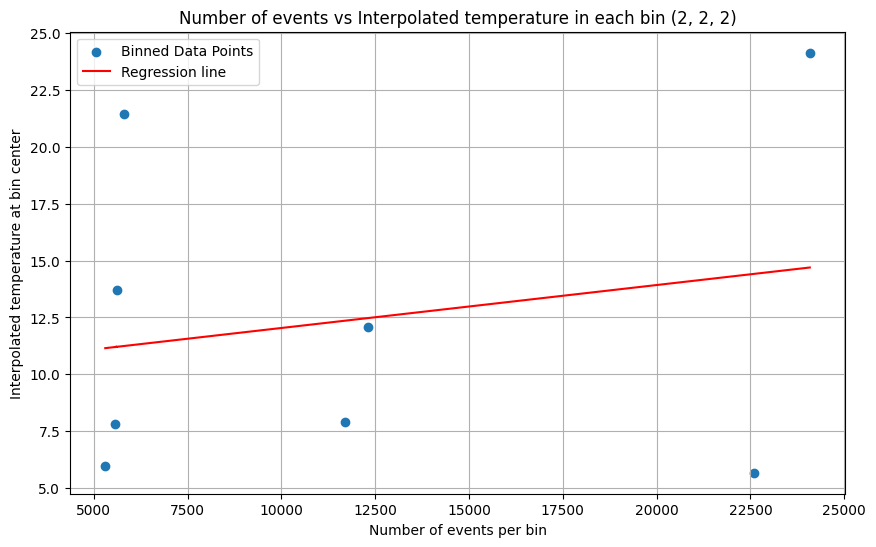

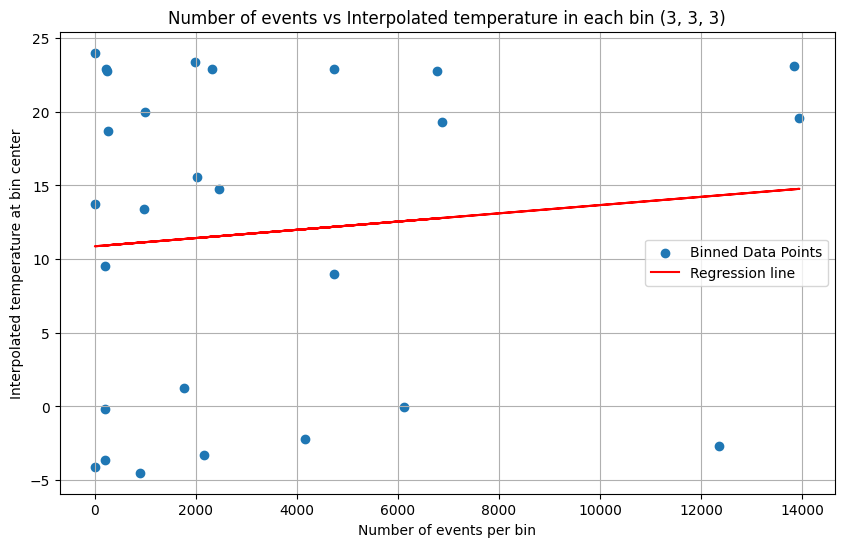

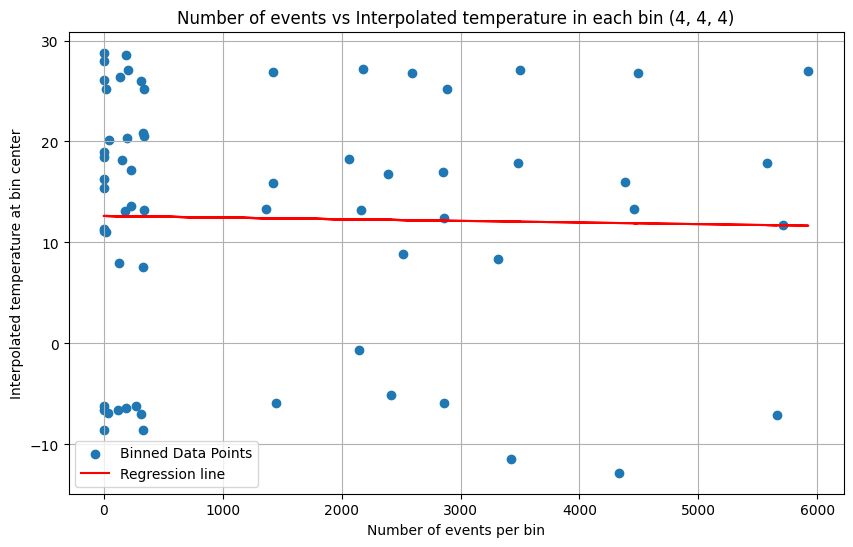

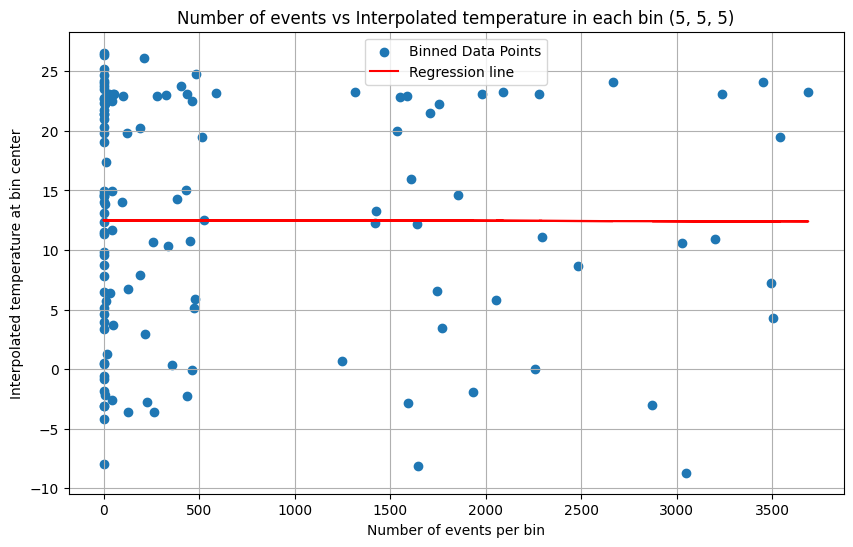

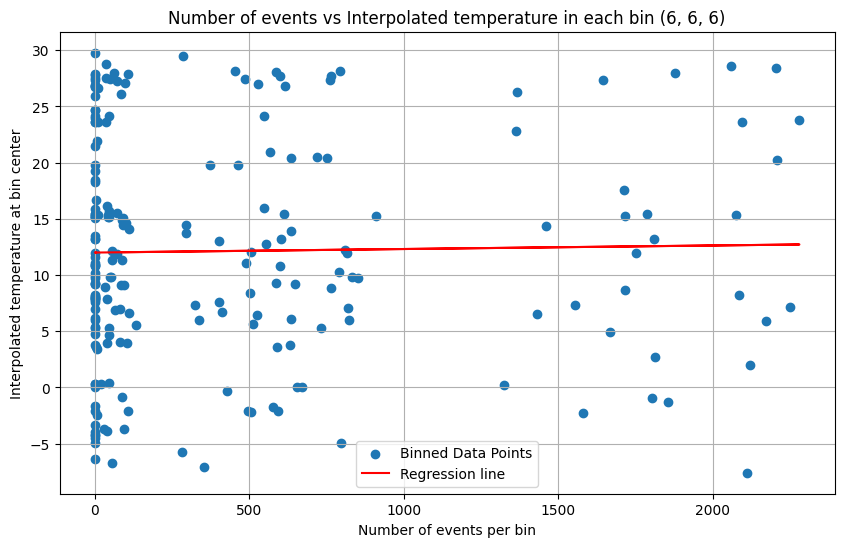

...

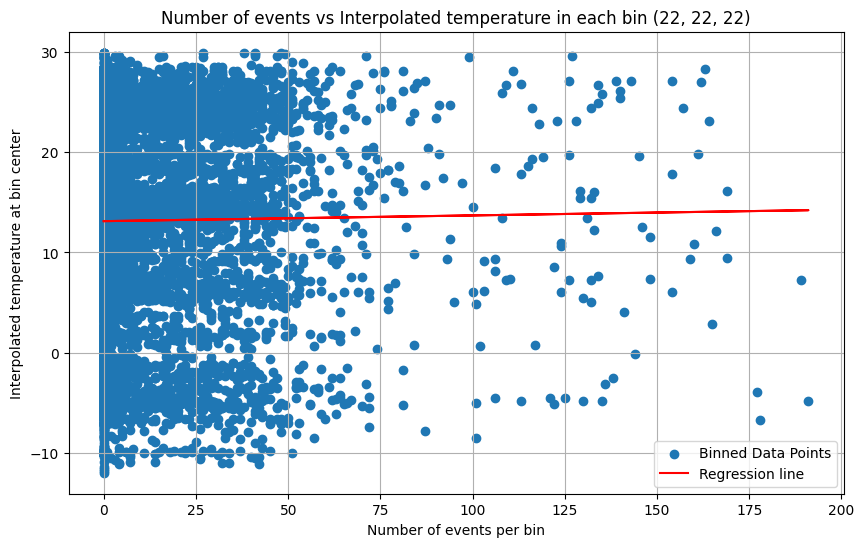

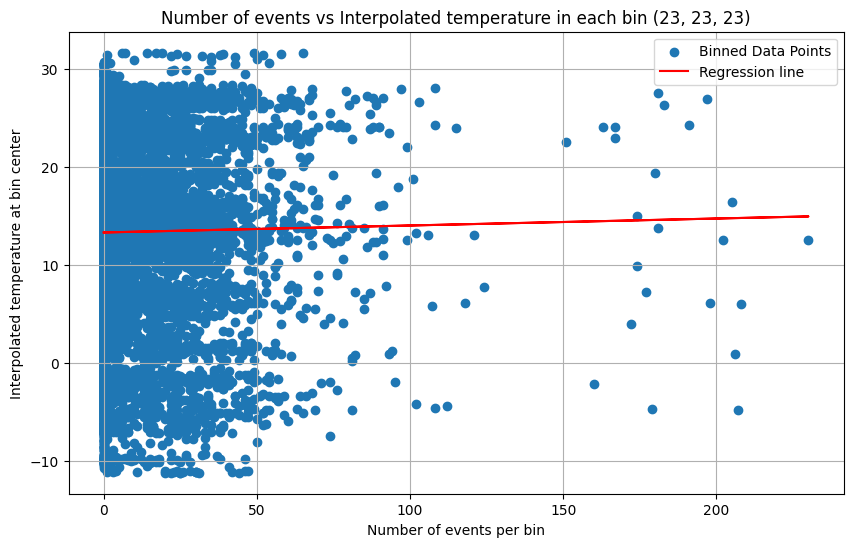

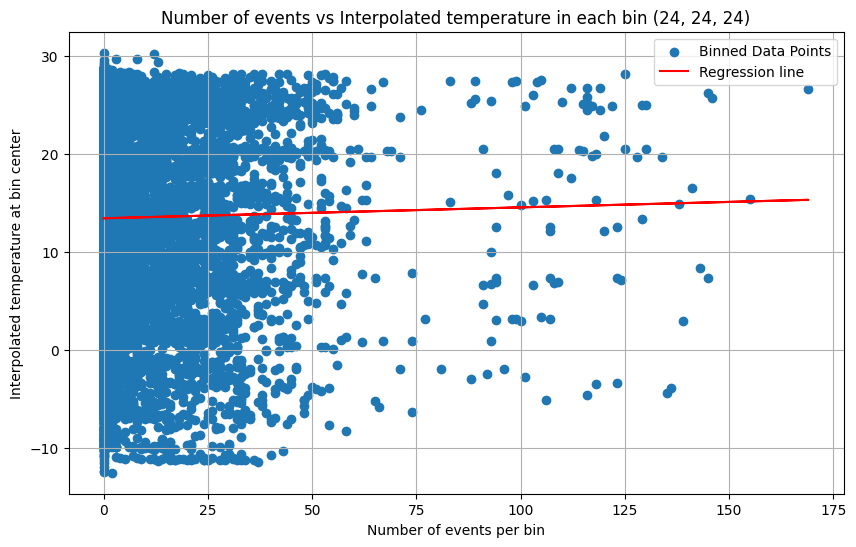

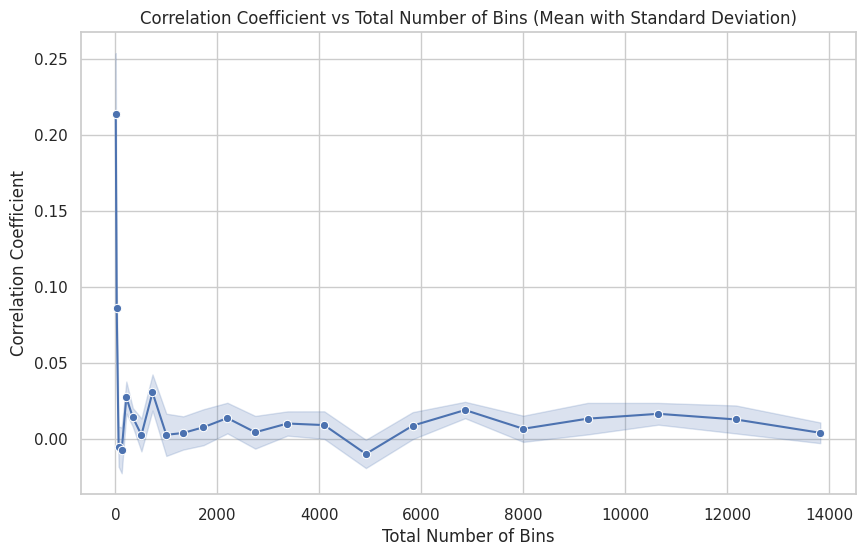

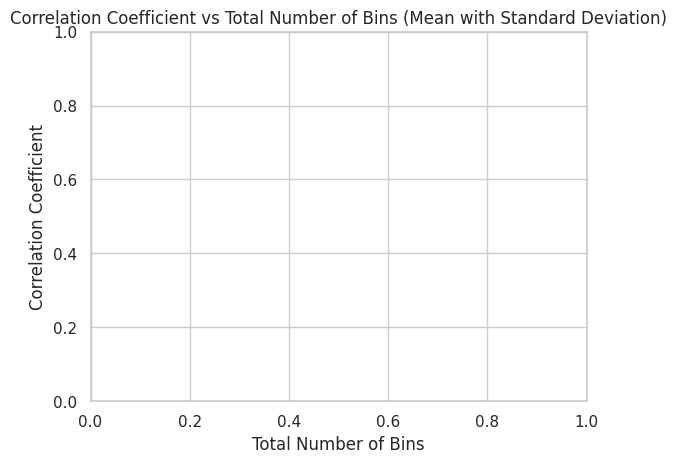

In [9]:
import glob
for input_folder in sorted(glob.glob("input_*/")):
  print(input_folder)
  try:
    df_events = pd.read_csv(input_folder+'events.csv')
    event_data = df_events[['x', 'y', 't']].values
    print('Event data loaded from events.csv')

    df_measurements = pd.read_csv(input_folder+'measurements.csv')
    contextual_time_series_observations = df_measurements[['x', 'y', 't', 'target_value']].values
    print('Contextual time series observations loaded from measurements.csv')
  except:
    print("skip "+input_folder)
    continue

  output_folder = input_folder.replace("input", "output")
  if not os.path.exists(output_folder):
    os.makedirs(output_folder)

  compute_linear_correlation(event_data, contextual_time_series_observations, output_folder)

# Binary Correlation

In [10]:
from scipy.stats import fisher_exact

def fisher_exact_test(a_low_b_low, a_low_b_high, a_high_b_low, a_high_b_high):
    """
    Performs Fisher's Exact Test on a 2x2 contingency table.

    Parameters:
        a_low_b_low (int): Count where a is low and b is low.
        a_low_b_high (int): Count where a is low and b is high.
        a_high_b_low (int): Count where a is high and b is low.
        a_high_b_high (int): Count where a is high and b is high.

    Returns:
        float: p-value from Fisher's Exact Test.
    """
    # Create the 2x2 contingency table
    table = [[a_low_b_low, a_low_b_high],
             [a_high_b_low, a_high_b_high]]

    # Perform Fisher's Exact Test
    odds_ratio, p_value = fisher_exact(table)

    return p_value



# Input count#
a_low_b_low = 10
a_low_b_high = 20
a_high_b_low = 30
a_high_b_high = 40

p_value = fisher_exact_test(a_low_b_low, a_low_b_high, a_high_b_low, a_high_b_high)
print(f"Fisher's Exact Test p-value: {p_value}")


Fisher's Exact Test p-value: 0.5044757698516285


In [14]:
import numpy as np
import pandas as pd
from scipy.interpolate import Rbf
from scipy.stats import fisher_exact
import matplotlib.pyplot as plt
from sklearn.neighbors import KDTree
import seaborn as sns

NUM_SPLITS = 51
NUM_RUNS = 5

# Read data from files
#events_df = pd.read_csv('events.csv')
#observations_df = pd.read_csv('measurements.csv')

# Define the interpolator function using Rbf from scipy.interpolate
def create_interpolator_vectorized(observations, k=100, eps=1e-5, temp_param=100):
    x = observations['x'].values
    y = observations['y'].values
    t = observations['t'].values
    target_values = observations['target_value'].values

    # Stack x, y, t into a feature matrix
    X = np.column_stack((x, y, t))

    # Build a KDTree for efficient neighbor searches
    kdtree = KDTree(X)

    # Define the interpolator function
    def interpolator(xi, yi, ti):
        xi = np.asarray(xi)
        yi = np.asarray(yi)
        ti = np.asarray(ti)
        Xi = np.column_stack((xi, yi, ti))
        interpolated_values = np.zeros(len(Xi))

        for idx, point in enumerate(Xi):
            # Find k nearest neighbors
            dist, ind = kdtree.query([point], k=k)
            neighbors_x = x[ind[0]]
            neighbors_y = y[ind[0]]
            neighbors_t = t[ind[0]]
            neighbors_values = target_values[ind[0]]

            # Create RBF interpolator with neighbors
            rbf = Rbf(neighbors_x, neighbors_y, neighbors_t, neighbors_values, function='linear', epsilon=eps)

            # Interpolate at the point
            interpolated_values[idx] = rbf(point[0], point[1], point[2])

        return interpolated_values

    return interpolator



# Helper function to compute thresholds
def compute_thresholds(all_event_counts, mean_target_values):
    # Compute the median event count over all bins, including zeros
    event_count_threshold = np.median(all_event_counts)

    # Compute the median target value and set the threshold
    target_measurement_threshold = np.median(mean_target_values)

    return event_count_threshold + 0.01, target_measurement_threshold

# Processing function
def process_bins(events_df, observations_df, interpolator, n_bins, event_count_threshold=None, target_measurement_threshold=None):
    # Define the edges of the bins for each dimension
    x_min = min(events_df['x'].min(), observations_df['x'].min())
    x_max = max(events_df['x'].max(), observations_df['x'].max())
    y_min = min(events_df['y'].min(), observations_df['y'].min())
    y_max = max(events_df['y'].max(), observations_df['y'].max())
    t_min = min(events_df['t'].min(), observations_df['t'].min())
    t_max = max(events_df['t'].max(), observations_df['t'].max())

    x_bins = np.linspace(x_min, x_max, n_bins + 1)
    y_bins = np.linspace(y_min, y_max, n_bins + 1)
    t_bins = np.linspace(t_min, t_max, n_bins + 1)

    # Digitize events to find out which bin they belong to
    event_indices = np.vstack((
        np.digitize(events_df['x'], bins=x_bins) - 1,
        np.digitize(events_df['y'], bins=y_bins) - 1,
        np.digitize(events_df['t'], bins=t_bins) - 1
    )).T

    # Ensure indices are within valid range
    event_indices = np.clip(event_indices, 0, n_bins - 1)

    # Generate all possible bin indices
    all_bin_indices = np.array(np.meshgrid(range(n_bins), range(n_bins), range(n_bins))).T.reshape(-1, 3)

    # Create a structured array for event bins
    event_bins = np.array([tuple(idx) for idx in event_indices])

    # Count the number of events in each bin, including zeros
    event_counts_dict = {tuple(bin_idx): 0 for bin_idx in map(tuple, all_bin_indices)}
    unique_bins, event_counts = np.unique(event_bins, axis=0, return_counts=True)
    for bin_idx, count in zip(unique_bins, event_counts):
        event_counts_dict[tuple(bin_idx)] = count

    # Get event counts as a list
    all_event_counts = np.array([event_counts_dict[tuple(idx)] for idx in all_bin_indices])

    # Compute cluster centers (midpoints of bins)
    x_centers = (x_bins[:-1] + x_bins[1:]) / 2
    y_centers = (y_bins[:-1] + y_bins[1:]) / 2
    t_centers = (t_bins[:-1] + t_bins[1:]) / 2

    # Generate cluster centers
    cluster_centers = np.array([
        [x_centers[idx[0]], y_centers[idx[1]], t_centers[idx[2]]] for idx in all_bin_indices
    ])

    # Interpolate mean target values at cluster centers
    mean_target_values = interpolator(cluster_centers[:, 0], cluster_centers[:, 1], cluster_centers[:, 2])

    # If thresholds are None, compute them using compute_thresholds
    if event_count_threshold is None or target_measurement_threshold is None:
        event_count_threshold, target_measurement_threshold = compute_thresholds(all_event_counts, mean_target_values)

    # Determine high or low event count based on threshold
    event_count_labels = ['high' if count > event_count_threshold else 'low' for count in all_event_counts]

    # Determine high or low mean target value based on threshold
    target_value_labels = ['high' if value > target_measurement_threshold else 'low' for value in mean_target_values]

    # Prepare contingency table counts
    contingency_counts = np.zeros((2, 2), dtype=int)  # Rows: event count (low/high), Columns: target value (low/high)

    # Map labels to indices
    label_to_index = {'low': 0, 'high': 1}

    for event_label, target_label in zip(event_count_labels, target_value_labels):
        row = label_to_index[event_label]
        col = label_to_index[target_label]
        contingency_counts[row, col] += 1

    # Prepare the contingency table for fisher_exact function
    contingency_table = contingency_counts

    # Perform Fisher's Exact Test
    _, p_value = fisher_exact(contingency_table)

    return p_value, contingency_counts, event_count_threshold, target_measurement_threshold

# Function to process data and return analysis results
def process_data(events_df, observations_df, interpolator, num_splits=NUM_SPLITS):
    bin_numbers = list(range(2, num_splits))
    p_values = []
    thresholds = []
    cont_tables = []

    for n_bins in bin_numbers:
        print("check number of bins: ", n_bins)
        p_value, contingency_counts, event_threshold, target_threshold = process_bins(
            events_df, observations_df, interpolator, n_bins)

        # Store the results
        p_values.append(p_value)
        thresholds.append((event_threshold, target_threshold))
        cont_tables.append(contingency_counts)

    return bin_numbers, p_values, thresholds, cont_tables

# Random cropping function adapted for DataFrame
def random_cropping_df(df, horizon=10.0):
    """
    Processes temporal data by sorting, filtering, and rescaling timepoints.

    Parameters:
    - df: A pandas DataFrame containing data, with a 't' column for timepoints.
    - horizon: The total duration of the time window.

    Returns:
    - A pandas DataFrame of the processed data, in the same format as the input data.
    """
    range_cut = horizon / 2.0

    # Step 1: Sort data based on 't' column
    df_sorted = df.sort_values(by='t').reset_index(drop=True)

    # Step 2: Sample a random starting point "start" between 0 and "range_cut"
    start = np.random.uniform(0, range_cut)

    # Step 3: Keep data points that are between "start" and "start + range_cut"
    end = start + range_cut
    mask = (df_sorted['t'] >= start) & (df_sorted['t'] <= end)
    df_filtered = df_sorted.loc[mask].copy()

    # Step 4: Rescale each timepoint t = (t - start) * 2.0
    df_filtered['t'] = (df_filtered['t'] - start) * 2.0

    return df_filtered


def compute_binary_correlation(events_df, observations_df, output_folder):
    # Create the interpolator function
    interpolator = create_interpolator_vectorized(observations_df, k=100, eps=0.001, temp_param=10)

    # Initialize list to store all p_values
    p_values_list = []

    # Loop over NUM_RUNS
    for run in range(NUM_RUNS):
        # Crop events_df
        cropped_events_df = random_cropping_df(events_df)
        # Call process_data
        bin_numbers, p_values, thresholds, cont_tables = process_data(cropped_events_df, observations_df, interpolator)
        # Create a DataFrame with bin_numbers, p_values, and run number
        df = pd.DataFrame({
            'bin_numbers': bin_numbers,
            'p_values': p_values,
            'run': run
        })
        p_values_list.append(df)

    # Concatenate all DataFrames
    all_p_values_df = pd.concat(p_values_list, ignore_index=True)

    # Plot using seaborn.lineplot
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=all_p_values_df, x='bin_numbers', y='p_values', hue='run', palette='tab10', legend=False)
    plt.title("P-Values from Fisher's Exact Test vs. Number of Bins (10 Runs)")
    plt.xlabel("Number of Bins (n_bins)")
    plt.ylabel("P-Value")
    plt.grid(True)
    plt.savefig(output_folder+'binary_values_final.pdf')
    plt.show()
    plt.close()

    #TODO add a sns.lineplot where the mean and the sd (specifically, estimator='mean',errorbar='sd',marker='o') is shown  and saved as plt.savefig(output_folder+'binary_values_sd_final.pdf')



### Run Code

In [ ]:
import glob
for input_folder in sorted(glob.glob("input_*/")):
  print(input_folder)
  try:
    events_df = pd.read_csv(input_folder+'events.csv')
    observations_df = pd.read_csv(input_folder+'measurements.csv')
  except:
    print("skip "+input_folder)
    continue

  output_folder = input_folder.replace("input", "output")
  if not os.path.exists(output_folder):
    os.makedirs(output_folder)

  compute_binary_correlation(events_df, observations_df, output_folder)

input_carcrash_vs_temperature/
check number of bins:  2
check number of bins:  3
check number of bins:  4
check number of bins:  5
check number of bins:  6
check number of bins:  7
check number of bins:  8
check number of bins:  9
check number of bins:  10
check number of bins:  11
check number of bins:  12
check number of bins:  13
check number of bins:  14
check number of bins:  15
check number of bins:  16
check number of bins:  17
check number of bins:  18
check number of bins:  19
